Dataset downloaded from: https://moleculenet.org/

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import rdkit
from rdkit import Chem
from rdkit.Chem import Draw

In [2]:
data = pd.read_csv('../datasets/HIV molecule inhibitor dataset/HIV.csv')
data

,smiles,activity,HIV_active
0,CCC1=[O+][Cu-3]2([O+]=C(CC)C1)[O+]=C(CC)CC(CC)...,CI,0
1,C(=Cc1ccccc1)C1=[O+][Cu-3]2([O+]=C(C=Cc3ccccc3...,CI,0
2,CC(=O)N1c2ccccc2Sc2c1ccc1ccccc21,CI,0
3,Nc1ccc(C=Cc2ccc(N)cc2S(=O)(=O)O)c(S(=O)(=O)O)c1,CI,0
4,O=S(=O)(O)CCS(=O)(=O)O,CI,0
...,...,...,...
41122,CCC1CCC2c3c([nH]c4ccc(C)cc34)C3C(=O)N(N(C)C)C(...,CI,0
41123,Cc1ccc2[nH]c3c(c2c1)C1CCC(C(C)(C)C)CC1C1C(=O)N...,CI,0
41124,Cc1ccc(N2C(=O)C3c4[nH]c5ccccc5c4C4CCC(C(C)(C)C...,CI,0
41125,Cc1cccc(N2C(=O)C3c4[nH]c5ccccc5c4C4CCC(C(C)(C)...,CI,0


In [3]:
print(data.shape) # (rows, columns)
print(data['HIV_active'].value_counts())

(41127, 3)
0    39684
1     1443
Name: HIV_active, dtype: int64


### Looking into samples

In [4]:
sample_smiles = data['smiles'][:28].values # To convert pd.Series to array
sample_smiles

array(['CCC1=[O+][Cu-3]2([O+]=C(CC)C1)[O+]=C(CC)CC(CC)=[O+]2',
       'C(=Cc1ccccc1)C1=[O+][Cu-3]2([O+]=C(C=Cc3ccccc3)CC(c3ccccc3)=[O+]2)[O+]=C(c2ccccc2)C1',
       'CC(=O)N1c2ccccc2Sc2c1ccc1ccccc21',
       'Nc1ccc(C=Cc2ccc(N)cc2S(=O)(=O)O)c(S(=O)(=O)O)c1',
       'O=S(=O)(O)CCS(=O)(=O)O', 'CCOP(=O)(Nc1cccc(Cl)c1)OCC',
       'O=C(O)c1ccccc1O', 'CC1=C2C(=COC(C)C2C)C(O)=C(C(=O)O)C1=O',
       'O=[N+]([O-])c1ccc(SSc2ccc([N+](=O)[O-])cc2[N+](=O)[O-])c([N+](=O)[O-])c1',
       'O=[N+]([O-])c1ccccc1SSc1ccccc1[N+](=O)[O-]',
       'CC(C)(CCC(=O)O)CCC(=O)O', 'O=C(O)Cc1ccc(SSc2ccc(CC(=O)O)cc2)cc1',
       'O=C(O)c1ccccc1SSc1ccccc1C(=O)O',
       'CCCCCCCCCCCC(=O)Nc1ccc(SSc2ccc(NC(=O)CCCCCCCCCCC)cc2)cc1',
       'Sc1cccc2c(S)cccc12', 'CCOP(N)(=O)c1ccccc1', 'NNP(=S)(NN)c1ccccc1',
       'O=P(Nc1ccccc1)(Nc1ccccc1)Nc1ccccc1',
       'O=C1C(O)=C(CCCc2ccc(Oc3ccccc3)cc2)C(=O)c2ccccc21',
       'CC(C)N(C(C)C)P(=O)(OP(=O)(c1ccc([N+](=O)[O-])cc1)N(C(C)C)C(C)C)c1ccc([N+](=O)[O-])cc1',
       'c1ccc2c(c1

Visualizing sample 2

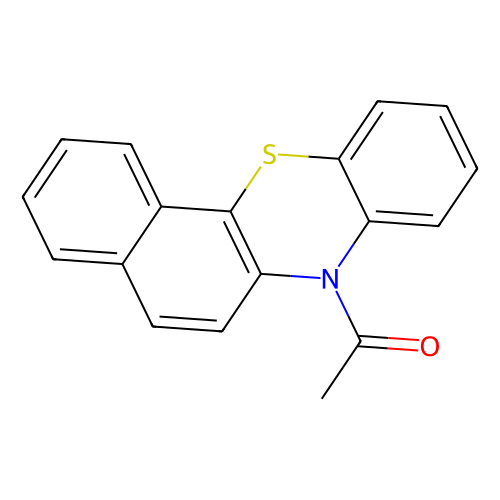

In [5]:
sample = 2
sample_molecules = [Chem.MolFromSmiles(smiles) for smiles in sample_smiles]
Draw.MolToImage(sample_molecules[sample], size = (500,500))

First 28 samples visualization

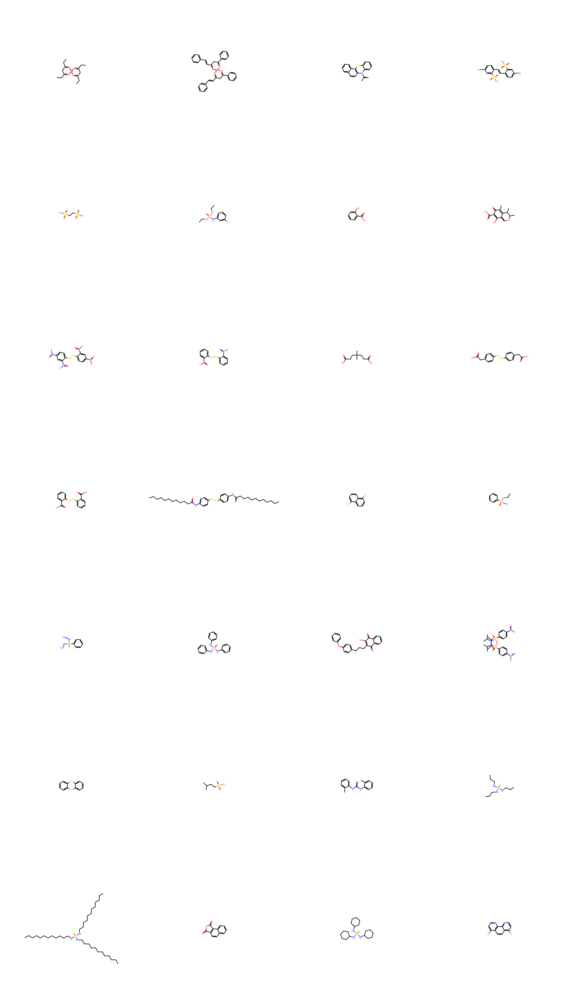

In [6]:
grid = Draw.MolsToGridImage(sample_molecules, molsPerRow=4, subImgSize=(500,500))
grid

## Creating Custom Dataset

In [7]:
import torch
from torch import nn
import torch_geometric
from torch_geometric import nn
from torch_geometric.data import Dataset, Data

# InMemoryDataset: Stores in RAM
# Dataset: Stroed in there machine in a specific folder

#### To understand what iterrows() and the functions do

In [8]:
for index, mol in data.iterrows():
    print(mol)
    print('\n',mol['smiles'],'\n')

smiles        CCC1=[O+][Cu-3]2([O+]=C(CC)C1)[O+]=C(CC)CC(CC)...
activity                                                     CI
HIV_active                                                    0
Name: 0, dtype: object

 CCC1=[O+][Cu-3]2([O+]=C(CC)C1)[O+]=C(CC)CC(CC)=[O+]2 

smiles        C(=Cc1ccccc1)C1=[O+][Cu-3]2([O+]=C(C=Cc3ccccc3...
activity                                                     CI
HIV_active                                                    0
Name: 1, dtype: object

 C(=Cc1ccccc1)C1=[O+][Cu-3]2([O+]=C(C=Cc3ccccc3)CC(c3ccccc3)=[O+]2)[O+]=C(c2ccccc2)C1 

smiles        CC(=O)N1c2ccccc2Sc2c1ccc1ccccc21
activity                                    CI
HIV_active                                   0
Name: 2, dtype: object

 CC(=O)N1c2ccccc2Sc2c1ccc1ccccc21 

smiles        Nc1ccc(C=Cc2ccc(N)cc2S(=O)(=O)O)c(S(=O)(=O)O)c1
activity                                                   CI
HIV_active                                                  0
Name: 3, dtype: object

 Nc1ccc(C=Cc2

In [9]:
mol_obj = sample_molecules[0]
print(mol_obj)
for edges in mol_obj.GetBonds():
    print(edges.GetBondTypeAsDouble())
    print(edges.GetBeginAtomIdx())
    print(edges.GetEndAtomIdx())
    print(edges.IsInRing())
    print()

1.0
0
1
False

1.0
1
2
False

2.0
2
3
True

1.0
3
4
True

1.0
4
5
True

2.0
5
6
True

1.0
6
7
False

1.0
7
8
False

1.0
6
9
True

1.0
4
10
True

2.0
10
11
True

1.0
11
12
False

1.0
12
13
False

1.0
11
14
True

1.0
14
15
True

1.0
15
16
False

1.0
16
17
False

2.0
15
18
True

1.0
9
2
True

1.0
18
4
True



### Custom Dataset

In [17]:
class MoleculeDataset(Dataset):
    def __init__(self, root, transform = None, pre_transform = None):
        """
            root = Where the dataset should be stored. This folder is split into
            raw_dir (downloaded dataset) and processed_dir (processed data)
        """
        super(MoleculeDataset, self).__init__(root, transform, pre_transform)
    
    @property # Automatically called when setting attributes
    def raw_file_names(self):
        """
            If this file exists in raw_dir, the download is not_triggered.
            (The download function is not implemented here)
        """
        return 'HIV.csv'
    
    @property # Automatically called when setting attributes
    def processed_file_names(self):
        """
            If these files are found in raw_dir, processing is skipped
        """
        
        return 'not_implemented.pt'
    
    def download(self):
        pass

    def process(self):
        self.data = pd.read_csv(self.raw_paths[0])

        for index, mol in tqdm(self.data.iterrows(), total = self.data.shape[0]):
            mol_obj = Chem.MolFromSmiles(mol['smiles'])
            
            # Get node features
            node_features = self._get_node_features(mol_obj)
            # Get edge index (edge list)
            edge_list = self._get_edge_list(mol_obj)
            # Get edge features
            edge_features = self._get_edge_features(mol_obj)
            # Get labels info
            label = self._get_label_information(mol['HIV_active'])

            # Creating a Data object
            data = Data(
                x = node_features,
                edge_index = edge_list,
                edge_attr = edge_features,
                y = label,
                smiles = mol['smiles']
            )

            torch.save(data, os.path.join(self.processed_dir, f'data_{index}.pt'))

    def _get_node_features(self, mol):
        """
            This will returen a matrix/2D array of the shape -
            [num_nodes, node_feature_size]

            We will use in-built rdkit functions for getting the features
            (There is a vast number of functions, check out the official
            site for more)
        """
        all_node_features = []
        
        for atom in mol.GetAtoms():
            node_features = []
            # Feature 1: Atomic Number
            node_features.append(atom.GetAtomicNum())
            # Feature 2: Atom Degree
            node_features.append(atom.GetDegree())
            # Feature 3: Formal Charge
            node_features.append(atom.GetFormalCharge())
            # Feature 4: Atomic Number
            node_features.append(atom.GetHybridization())
            # Feature 5: Atomic Number
            node_features.append(atom.GetIsAromatic())
            # Combining all
            all_node_features.append(node_features)
        
        all_node_features = np.asarray(all_node_features)
        return torch.tensor(all_node_features, dtype=torch.float32)
    
    def _get_edge_features(self, mol):
        """
            Thsi will return a matrix/2D array of the shape -
            [num_edges, edge_feature_size]

            We will use in-built rdkit functions for getting the features
            (There is a vast number of functions, check out the official
            site for more)
        """
        all_edge_features = []

        for edges in mol.GetBonds():
            edge_features = []

            # Feature 1: Bond Type (as double)
            edge_features.append(edges.GetBondTypeAsDouble())

            # Feature 2: Is in Ring 
            edge_features.append(edges.IsInRing())

            # Combining all
            all_edge_features.append(edge_features)
        
        all_edge_features = np.asarray(all_edge_features)
        return torch.tensor(all_edge_features, dtype = torch.float32)
    
    def _get_edge_list(self, mol):
        """
            We could also use rdmolops.GetAdjacencyMatrix(mol)
            but we want to be sure that the order of the indices
            matches the order of the edge features
        """
        edge_indices = []
        for edges in mol.GetBonds():
            i = edges.GetBeginAtomIdx()
            j = edges.GetEndAtomIdx()
            edge_indices.extend([[i,j],[j,i]])
        
        edge_indices = torch.tensor(np.asarray(edge_indices))
        edge_indices = edge_indices.t().to(torch.long).view(2,-1)
        return edge_indices
    
    def _get_label_information(self, label):
        return torch.tensor(np.asarray([label]), dtype = torch.int32)
    
    def len(self):
        return self.data.shape[0]
    
    def get(self, idx):
        """ 
            - Equivalent to __getitem__ in pytorch
            - Is not needed for PyG's InMemoryDataset
        """
        return torch.load(os.path.join(self.processed_dir, f'data_{idx}.pt')) 

In [23]:
dataset = MoleculeDataset(root = '../datasets/HIV molecule inhibitor dataset/')

Processing...
 85%|████████▌ | 35099/41127 [01:09<00:11, 517.54it/s][07:41:50] WARNING: not removing hydrogen atom without neighbors
[07:41:50] WARNING: not removing hydrogen atom without neighbors
100%|██████████| 41127/41127 [01:21<00:00, 504.76it/s]
Done!


In [25]:
print(dataset[0].edge_index.t())
print(dataset[0].x)
print(dataset[0].edge_attr)
print(dataset[0].y)

tensor([[ 0,  1],
        [ 1,  0],
        [ 1,  2],
        [ 2,  1],
        [ 2,  3],
        [ 3,  2],
        [ 3,  4],
        [ 4,  3],
        [ 4,  5],
        [ 5,  4],
        [ 5,  6],
        [ 6,  5],
        [ 6,  7],
        [ 7,  6],
        [ 7,  8],
        [ 8,  7],
        [ 6,  9],
        [ 9,  6],
        [ 4, 10],
        [10,  4],
        [10, 11],
        [11, 10],
        [11, 12],
        [12, 11],
        [12, 13],
        [13, 12],
        [11, 14],
        [14, 11],
        [14, 15],
        [15, 14],
        [15, 16],
        [16, 15],
        [16, 17],
        [17, 16],
        [15, 18],
        [18, 15],
        [ 9,  2],
        [ 2,  9],
        [18,  4],
        [ 4, 18]])
tensor([[ 6.,  1.,  0.,  4.,  0.],
        [ 6.,  2.,  0.,  4.,  0.],
        [ 6.,  3.,  0.,  3.,  0.],
        [ 8.,  2.,  1.,  3.,  0.],
        [29.,  4., -3.,  0.,  0.],
        [ 8.,  2.,  1.,  3.,  0.],
        [ 6.,  3.,  0.,  3.,  0.],
        [ 6.,  2.,  0.,  4.,  0.],

## Naive Global Pooling
Perform mean, max and sum of the final node embeddings, and concatenate to finally obtain one vector.

<p align="center">
<img src="../images/Naive Pooling methods.png" style="width:450px;height:250px;">
</p>

Problem with this approach is we lose a lot of information, hence we will use **Hierarchical Pooling** or **Super/Dummy/Virtual Node method**, as explained in the next sections.

## Hierarchical Pooling
We shall perform this as shown below
<p align="center">
<img src="../images/Hierarchical Pooling in Graphs.png" style="width:450px;height:250px;">
</p>

How do we reduce the size of the graph?

### Differentiable Pooling
Cluster the nodes, aggregate them, and output a new graph.
<p align="center">
<img src="../images/Differentiable Pooling.png" style="width:450px;height:250px;">
</p>

### Top-K Pooling
A learnable neural network squeezes every node embeddings to a single value (1D), and then let it decide which to keep and which nodes to discard.
<p align="center">
<img src="../images/Top-K Pooling.png" style="width:450px;height:250px;">
</p>

## Super/Dummy/Virtual Node Method
This method creates an extra node, with all nodes connected to this extra node (Directed edges). After few layers of message passing, this node will have enough information of all the nodes. The embedding of this extra node is used as the final vector used for prediction.

<p align="center">
<img src="../images/Super Node method.png" style="width:450px;height:250px;">
</p>